# LAB 1

## 1. Θεωρητικό μέρος

α) Πώς η τιμή του α επηρεάζει την γκαουσιανή πυραμίδα;

Το 'α' αναφέραι στην τυπική απόκλιση του φίλτρου που χρησιμοποιείται για την δημιουργία της πυραμίδας. Η τιμή του 'α' επηρεάζει το μέγεθος του πυρήνα του φίλτρου και τον βαθμό της εξομάλυνσης που εφαρμόζεται στην εικόνα. Η πυραμίδα αποκτά γκαουσιανή μορφή όταν α = 0,4 . Όταν το α μικραίνει(για α = 0,3) το σχήμα γίνεται πιο επίπεδο και ευρύνεται. Όταν το 'α' αυξάνεται παίρνει τριγωνική μορφή(για α = 0,5) και όταν αυξηθεί περισσότερο(α = 0,6) το κέντρο κορυφώνεται περισσότερο και πλαισιώνεται από μικρούς αρνητικούς λοβούς.

β) Τι ορίζουμε ως εντροπία; Υπολογίστε τη μέγιστη τιμή εντροπίας που μπορεί να έχει μια
grayscale εικόνα;

Η εντροπία είναι ένα μέτρο της ποσότητας πληροφοριών ή αβεβαιότητας σε ένα σύστημα. Στην περίπτωση του image representation αναπαριστά την ποσότητα της πληροφορίας που βρίσκεται στις τιμές των pixel της εικόνας. Αν υποθέσουμε ότι οι τιμές των pixels είναι στατισιτκά ανεξάρτητες τότε ο ελάχιστος αριθμός bit
ανά pixel που απαιτείται για την ακριβή κωδικοποίηση της εικόνας δίνεται από την εντροπία της κατανομής της τιμής των pixels.

Η μέγιστη τιμή εντροπίας μιας grayscale εικόνας θα ήταν 8 αφού αναπαριστάται απο 256 gray levels και λαμβάνεται όταν όλα τα επίπεδα του γκρι ήταν εξίσου πιθανά. Στην πραγματικότητα τα gray levels μιας φυσιολογικής grayscale εικόνας δεν θα είναι ισοπίθανα και η τιμή θα είναι μικρότερη απο 8.

γ) Πώς η επιλογή του μεγέθους του bin επηρεάζει το αποτέλεσμα του κβαντισμού;

Κατα την κβαντοποίση μειώνουμε τον αριθμό ξεχωριστών χρωμάτων ή αποχρόσεων του γκρι που αναπαριστούν μια εικόνα. Ο αριθμός αυτός χαρακτηρίζεται ώς bins.

Όταν αυξήσουμε το μέγεθος του bin, τότε μειώνεται ο αριθμός τους και κάθε bin αναπαριστά ένα μεγαλύτερο έυρος απο pixels. Τα pixels στο ίδιο bin αποκτούν το ίδιο value με αποτέλεσμα να χάνεται πληροφορία και να αυξάνετται το quantization error όμως μπορεί με πιο λίγα bits να αναπαρασταθεί η πληροφορία που απομένει.

Αντίθετα αν μειώσουμε το μέγεθος τους, αυξάνεται ο αριθμός τους και κάθε bin αναπαριστά ένα μειωμένο εύρος απο pixels με αποτέλεσμα μια πιο καλή αναπαράσταση του σήματος. Με αυτό το τρόπο διατηρείται περισσότερη πληροφορία και μειώνεται το quantization error. Παρ' όλα αυτά η πληροφορία που απομένει χρειάζεται περισσότερα bits για να αναπαρασταθεί.

δ) Εξηγήστε πώς επηρεάζεται η κβάντιση από το πλήθος των επιπέδων της πυραμίδας;


Το μέγεθος του bin σε ένα επίπεδο της πυραμίδας αντικατοπτρίζει την ευαισθησία του ανθρώπου παρατηρητή σε σφάλματα αντίθεσης εντός των χωρικών ζωνών συχνοτήτων
σε αυτό το επίπεδο. Οι άνθρωποι είναι αρκετά ευαίσθητοι σε
διαταραχές αντίθεσης σε χαμηλές και μεσαίες χωρικές συχνότητες, αλλά
σχετικά μη ευαίσθητοι σε τέτοιες διαταραχές σε υψηλές χωρικές
συχνότητες. Η ευαισθησία των παρατηρητών σε συνδιασμό με την αυξημένη διακύμανση δεδομένων σημαίνει ότι περισσότερα επίπεδα κβαντισμού
πρέπει να χρησιμοποιείται σε υψηλά επίπεδα πυραμίδας παρά σε χαμηλά επίπεδα.

## 2. Εργαστηριακό μέρος

### Α. Υλοποίηση Αλγορίθμου

Υλοποιήστε τις συναρτήσεις

In [ ]:
import numpy as np
from scipy.signal import convolve2d
import cv2

α) h = GKernel(a): δημιουργεί ένα Generating Kernel, εξαρτώμενο από την παράμετρο ‘a’

In [ ]:
def GKernel(a):
    b = 1/4
    c = 1/4 - a/2
    kernel_1d = np.array([c, b, a, b, c])
    kernel_2d = np.outer(kernel_1d, kernel_1d)
    kernel_2d = kernel_2d / np.sum(kernel_2d)
    return kernel_2d

β) GREDUCE(I, h): σύμφωνα με την εξίσωση (1) (σελίδα 533 του άρθρου)

In [ ]:
def GREDUCE(I, h):
    # Get the size of the input image
    rows, cols = I.shape

    # Define the padding size to maintain the image size after convolution
    pad_size = int((len(h)-1)/2)

    # Pad the input image with zeros
    I_pad = np.pad(I, ((pad_size, pad_size), (pad_size, pad_size)), 'constant')

    # Convolve the image with the kernel
    I_conv = convolve2d(I_pad, h, mode='valid')

    # Reduce the image by taking every other pixel
    I_out = I_conv[::2, ::2]

    return I_out

γ) G = GPyramid(I, a, depth): θα δέχεται ως είσοδο μία εικόνα Ι, την παράμετρο ‘a’, το επιθυμητό
βάθος για την πυραμίδα ’depth’ και θα επιστρέφει την Gaussian
pyramid και θα την αποθηκεύει. Κατά την εκτέλεσή της θα καλεί τις
συναρτήσεις GKernel(a) και GREDUCE(I,h))

In [ ]:
def GPyramid(I, a, depth):
    G = []
    G.append(I)
    h = GKernel(a)
    for i in range(1, depth+1): #depth 5 -> 6 pictures: g0 the original, and 5 reduced
        I = GREDUCE(I, h)
        G.append(I)
    return G

δ) GEXPAND (I, h): σύμφωνα με την εξίσωση (2) (σελίδα άρθρου 534).

In [ ]:
def GEXPAND(I, h):
    I=I.astype('float32')
    expanded_image = cv2.resize(I, (I.shape[0]*2, I.shape[1]*2), interpolation=cv2.INTER_AREA)
    return cv2.filter2D(expanded_image, -1, h).astype(int)

ε) LPyramid(I, a, depth): θα επιστρέφει την Laplacian πυραμίδα της εικόνας I (χρησιμοποιήστε
τη συνάρτηση GPyramid)

In [ ]:
def L_Pyramid(I, a, depth):
    images=[I]
    if(len(I.shape)==3 and I.shape[2]==3):
      #RGB
      images=[]
      for i in range(3):
        images.append(I[:,:,i])
    L=[]
    ll=[]
    h = GKernel(a)
    for I in images:
      G = GPyramid(I,a,depth)
      l = []
      for i in range(depth):
          l.append(G[i]-GEXPAND(G[i+1],h)+128)
      l.append(G[depth])
      ll.append(l)
    for i in range(depth+1):
      temp=[]
      for l in ll:
        temp.append(l[i])
      L.append(np.dstack(temp).astype(int))
    return L

στ) L_Pyramid_Decode(L,a): θα επιστρέφει την αποκωδικοποιημένη εικόνα I_out,
λαμβάνοντας ως είσοδο την Laplacian πυραμίδα L και την παράμετρο 'a' που χρησιμοποιήθηκε
για τη δημιουργία της

In [ ]:
def L_Pyramid_Decode(L,a):
    pyramids=[L]
    if(len(L[0].shape)==3 and L[0].shape[2]==3):
      #RGB
      pyramids=[]
      for i in range(3):
        l=[]
        for I in L:
          l.append(I[:,:,i])
        pyramids.append(l)
    depth = len(L)-1
    h = GKernel(a)
    G=[]
    gg=[]
    for L in pyramids:
      g = L[depth]
      for i in range(depth):
          g = GEXPAND(g,h)
          g = g.reshape((g.shape[0],g.shape[1],1))+L[depth-1-i].reshape((g.shape[0],g.shape[1],1))-128
      gg.append(g)

    #Gray-scale
    if len(gg)==1:
      return gg[0].reshape((gg[0].shape[0],gg[0].shape[1]))

    #RGB
    G=np.dstack(gg)
    return G.astype(int)

ζ) L_Quantization, σύμφωνα με την εξίσωση (5) (σελ. άρθρου 538).

In [ ]:
def L_Quantization(Ι,nofbins):
  bins = np.linspace(0, I.max(), nofbins)
  quantized_I = np.digitize(I, bins)
  quantized_I = (np.vectorize(bins.tolist().__getitem__)
  (quantized_I-1).astype(int))
  quantized_I = np.asarray(quantized_I, dtype=np.uint8)
  return quantized_I

### Β. Δοκιμές Αλγορίθμου

α) Ελέγξτε τις υλοποιήσεις των συναρτήσεών σας L_Pyramid και L_Pyramid_Decode
χρησιμοποιώντας τις εικόνες Lena και camera. Πρέπει να λειτουργούν και για έγχρωμες και για
grayscale εικόνες.


Grayscale Picture:


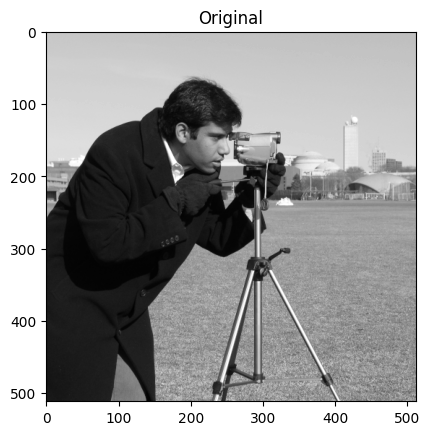

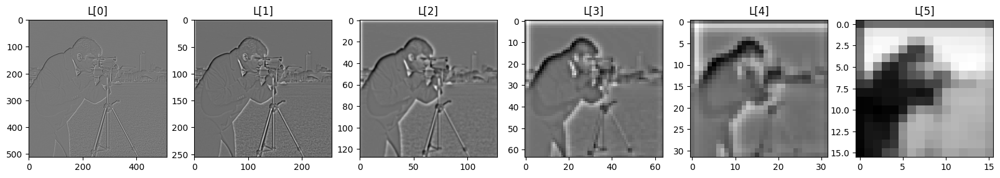

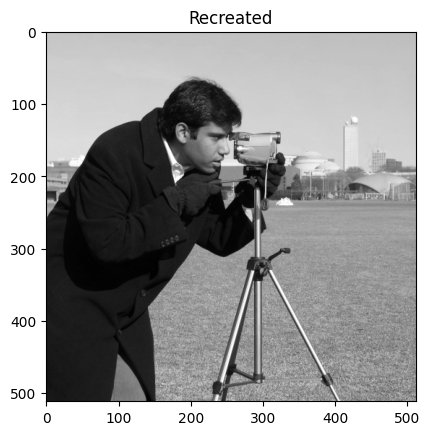

RGB Picture:


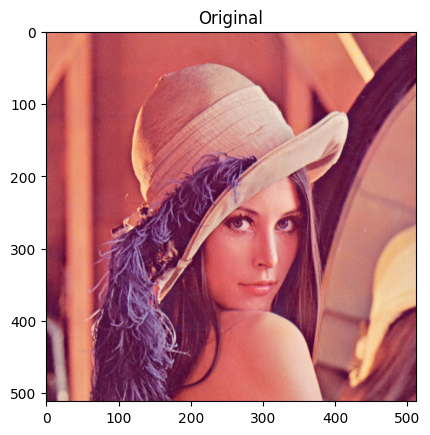

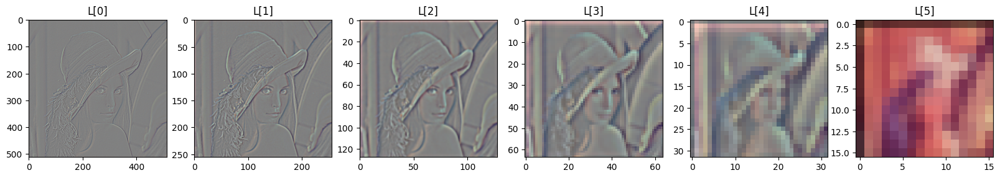

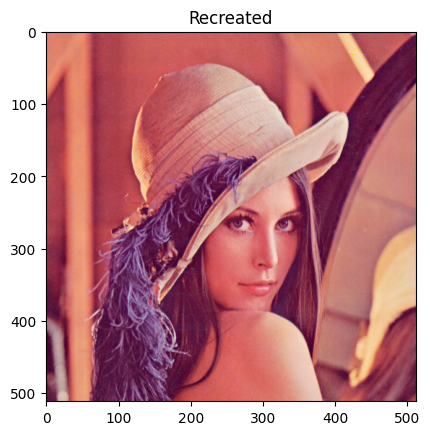

In [ ]:
import matplotlib.pyplot as plt
import imageio.v3 as iio
from skimage import data
camera = data.camera()

a=0.4
d=5
print("Grayscale Picture:")
plt.imshow(camera,cmap='gray')
plt.title('Original')
L=L_Pyramid(camera,a,d)
f,(ax0,ax1,ax2,ax3,ax4,ax5)=plt.subplots(1,6,figsize=(20,20))
ax0.imshow(L[0],cmap='gray')
ax0.set_title('L[0]')
ax1.imshow(L[1],cmap='gray')
ax1.set_title('L[1]')
ax2.imshow(L[2],cmap='gray')
ax2.set_title('L[2]')
ax3.imshow(L[3],cmap='gray')
ax3.set_title('L[3]')
ax4.imshow(L[4],cmap='gray')
ax4.set_title('L[4]')
ax5.imshow(L[5],cmap='gray')
ax5.set_title('L[5]')
plt.show()
camera_check=L_Pyramid_Decode(L,a)
plt.imshow(camera_check,cmap="gray")
plt.title('Recreated')
plt.show()

lena = iio.imread("http://www.image.ntua.gr/~tpar/LABimage/lena.png")

print("RGB Picture:")
plt.imshow(lena)
plt.title('Original')
L=L_Pyramid(lena,a,d)
f,(ax0,ax1,ax2,ax3,ax4,ax5)=plt.subplots(1,6,figsize=(20,20))
ax0.imshow(L[0])
ax0.set_title('L[0]')
ax1.imshow(L[1])
ax1.set_title('L[1]')
ax2.imshow(L[2])
ax2.set_title('L[2]')
ax3.imshow(L[3])
ax3.set_title('L[3]')
ax4.imshow(L[4])
ax4.set_title('L[4]')
ax5.imshow(L[5])
ax5.set_title('L[5]')
plt.show()
lena_check=L_Pyramid_Decode(L,a)
plt.imshow(lena_check)
plt.title('Recreated')
plt.show()

In [ ]:
import math
def entropy(I):
  pix=I.ravel();
  tot=np.product(I.shape)
  levels=[]
  for i in range(256):
    levels.append(0)
  for i in pix:
    levels[i]+=1
  ans=0
  for i in levels:
    if i==0 : continue
    f=i/tot
    ans-=f*math.log2(f)
  return ans


β) Εμφανίστε την αρχική και την αποκωδικοποιημένη εικόνα, χρησιμοποιώντας διαφορετικά ‘a’ με
τιμές να κυμαίνονται στο διάστημα [0.3,..,0.7].


Grayscale Picture:


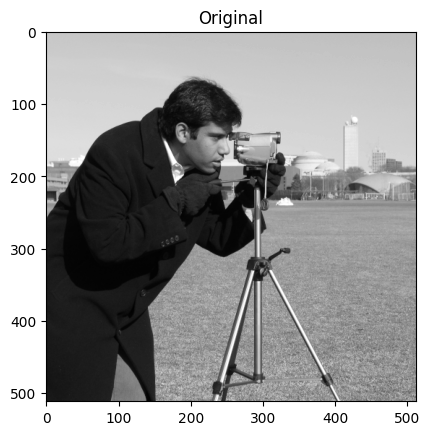

for a = 0.3


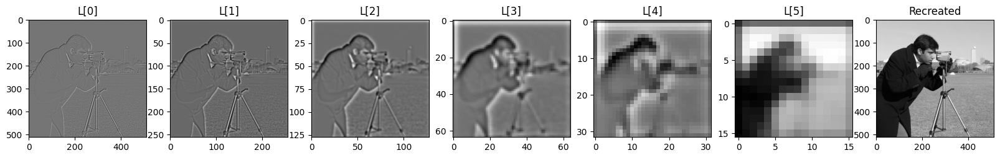

for a = 0.4


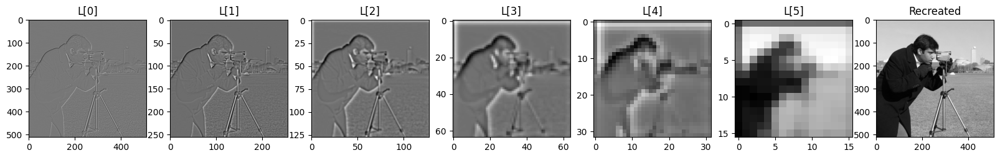

for a = 0.5


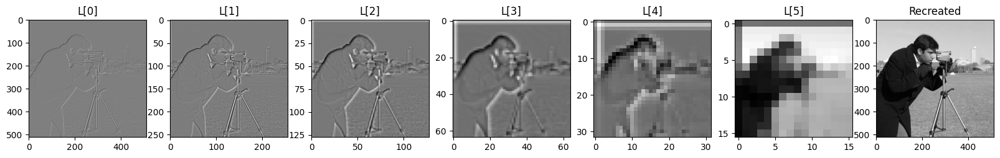

for a = 0.6


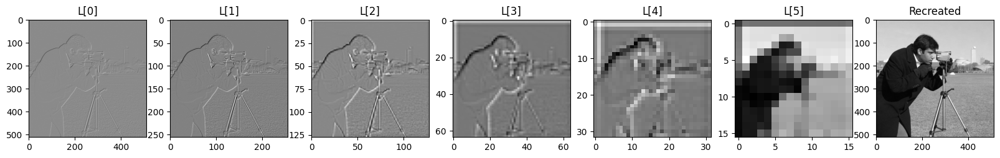

for a = 0.7


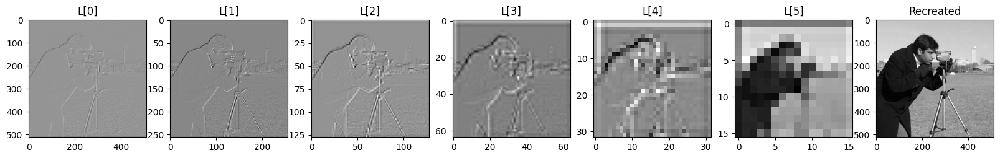

RGB Picture:


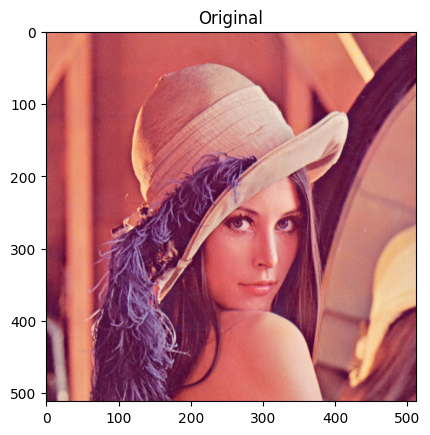

for a = 0.3


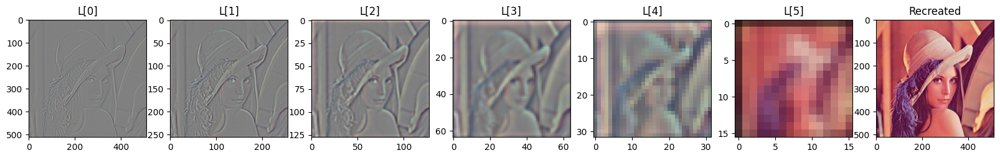

for a = 0.4


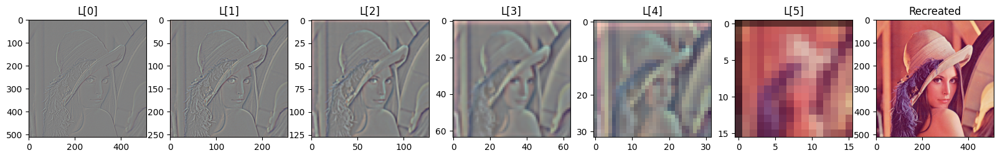

for a = 0.5


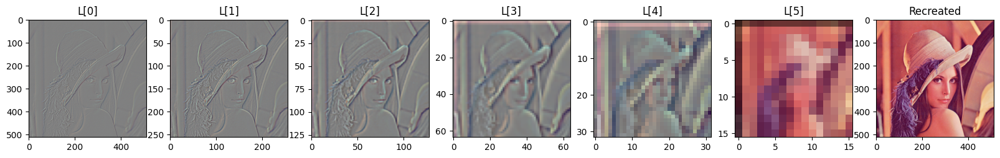

for a = 0.6


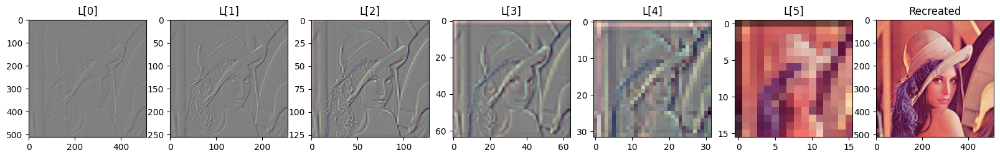

for a = 0.7


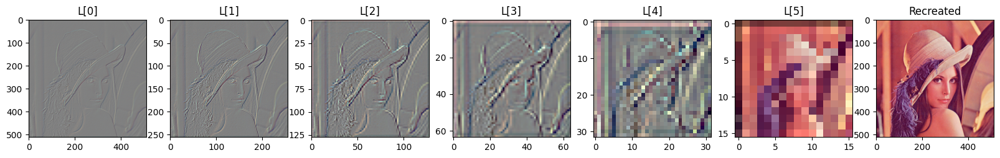

In [ ]:
import scipy.stats as st

print("Grayscale Picture:")
plt.imshow(camera,cmap="gray")
plt.title('Original')
plt.show()
camera_entropy_a=[]

d=5
for a in [0.3,0.4,0.5,0.6,0.7]:
  print("for a =",a)
  f,(ax0,ax1,ax2,ax3,ax4,ax5,ax6)=plt.subplots(1,7,figsize=(20,20))
  L=L_Pyramid(camera,a,5)
  ax0.imshow(L[0],cmap='gray')
  ax0.set_title('L[0]')
  ax1.imshow(L[1],cmap='gray')
  ax1.set_title('L[1]')
  ax2.imshow(L[2],cmap='gray')
  ax2.set_title('L[2]')
  ax3.imshow(L[3],cmap='gray')
  ax3.set_title('L[3]')
  ax4.imshow(L[4],cmap='gray')
  ax4.set_title('L[4]')
  ax5.imshow(L[5],cmap='gray')
  ax5.set_title('L[5]')
  camera_check=L_Pyramid_Decode(L,a)
  camera_entropy_a.append(st.entropy(camera_check)[0])
  ax6.imshow(camera_check,cmap="gray")
  ax6.set_title('Recreated')
  plt.show()

print("RGB Picture:")
plt.imshow(lena)
plt.title("Original")
plt.show()
lena_entropy_a=[]

for a in [0.3,0.4,0.5,0.6,0.7]:
  print("for a =",a)
  f,(ax0,ax1,ax2,ax3,ax4,ax5,ax6)=plt.subplots(1,7,figsize=(20,20))
  L=L_Pyramid(lena,a,5)
  ax0.imshow(L[0])
  ax0.set_title('L[0]')
  ax1.imshow(L[1])
  ax1.set_title('L[1]')
  ax2.imshow(L[2])
  ax2.set_title('L[2]')
  ax3.imshow(L[3])
  ax3.set_title('L[3]')
  ax4.imshow(L[4])
  ax4.set_title('L[4]')
  ax5.imshow(L[5])
  ax5.set_title('L[5]')
  lena_check=L_Pyramid_Decode(L,a)
  lena_entropy_a.append(np.mean(st.entropy(lena_check)[0]))
  ax6.imshow(lena_check)
  ax6.set_title('Recreated')
  plt.show()

Όσο μικρότερο είναι το 'α' τόση περισσότερη πληροφορία διατηρείται σε κάθε επίπεδο ενώ αποκωδικοποίηση με μεγαλύερο 'α' παράγει smoother εικόνες. Παρατηρούμε ότι σε κάθε επίπεδο οι αρχικές εικόνες που είχαν διαστάσεις 512x512 γίνονται downsampled και οι διαστάσεις μοιράζονται δια 2.

γ) Εμφανίστε την αρχική και την αποκωδικοποιημένη εικόνας, χρησιμοποιώντας διαφορετικά
‘depth’ με τιμές να κυμαίνονται στο διάστημα [3,..,6].


Grayscale Picture:


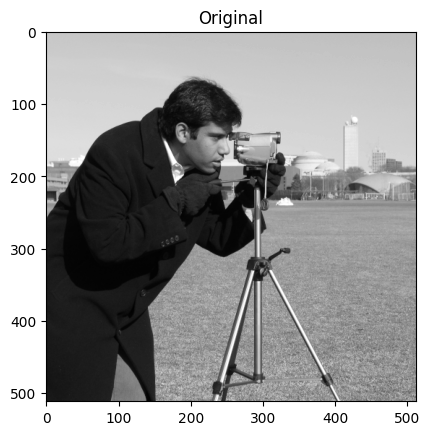

for depth = 3


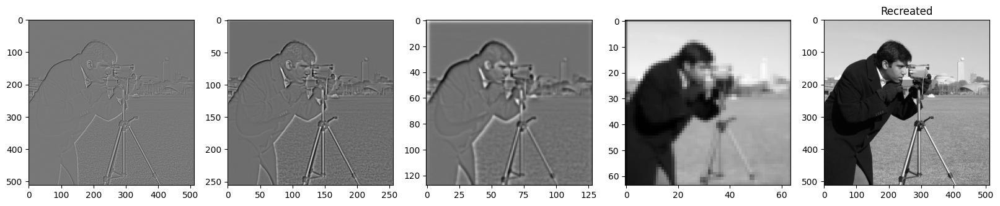

for depth = 4


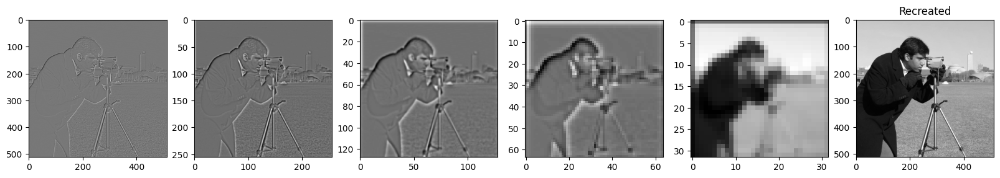

for depth = 5


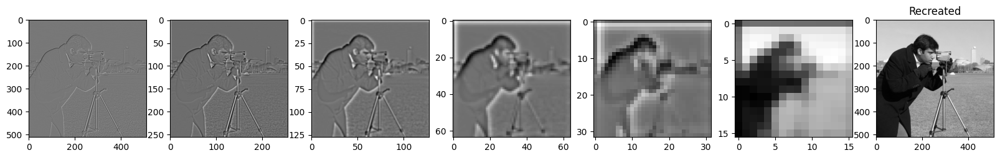

RGB Picture:


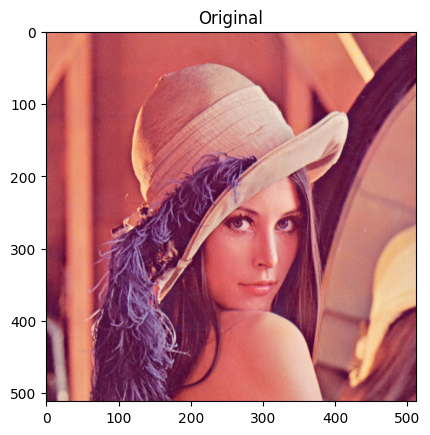

for depth = 3


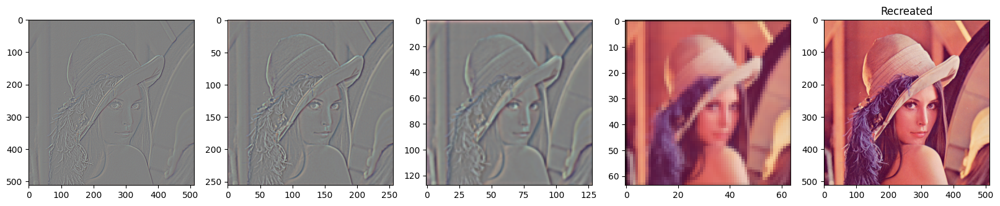

for depth = 4


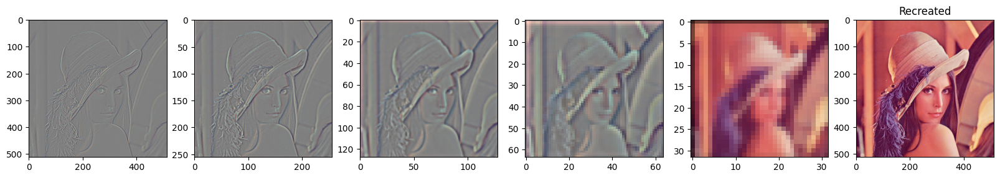

for depth = 5


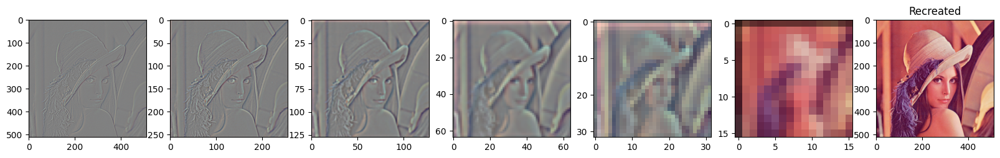

In [ ]:
print("Grayscale Picture:")
plt.imshow(camera,cmap="gray")
plt.title('Original')
plt.show()
camera_entropy_d=[]

a=0.4
for d in [3,4,5]:
  print("for depth =",d)
  f,axis=plt.subplots(1,d+2,figsize=(20,20))
  L=L_Pyramid(camera,a,d)
  for i in range(d+1):
    axis[i].imshow(L[i],cmap='gray')
    #axis[i].set_title('L['.format(i))
  camera_check=L_Pyramid_Decode(L,a)
  camera_entropy_d.append(st.entropy(camera_check)[0])
  axis[d+1].imshow(camera_check,cmap="gray")
  axis[d+1].set_title('Recreated')
  plt.show()

print("RGB Picture:")
plt.imshow(lena)
plt.title("Original")
plt.show()
lena_entropy_d=[]

for d in [3,4,5]:
  print("for depth =",d)
  f,axis=plt.subplots(1,d+2,figsize=(20,20))
  L=L_Pyramid(lena,a,d)
  for i in range(d+1):
    axis[i].imshow(L[i])
    #axis[i].set_title('L['.format(i))
  lena_check=L_Pyramid_Decode(L,a)
  lena_entropy_d.append(np.mean(st.entropy(lena_check)[0]))
  axis[d+1].imshow(lena_check)
  axis[d+1].set_title('Recreated')
  plt.show()

Καθώς το depth αυξάνεται κάθε επίπεδο υποδειγματοληψίας παράγει μικρότερες εικόνες αφού η εικόνα μοιράζεται σε όλο και πιο μικρά blocks σε κάθε επίπεδο. Έτσι χρειάζονται περισσότερα επίπεδα υποδειγματοληψίας ώστε να παραχθεί μια πλήρης εικόνα όπως φαίνεται και απο τα αποτελέσματα.

δ) Υπολογίστε τη εντροπία και παρουσιάστε τα αντίστοιχα διαγράμματα για τα διαφορετικά ‘a’, και
‘depth’ , για κάθε εικόνα και σχολιάστε επαρκώς.


Grayscale Picture:
Entropy of recreated image with d=5 and a= 0.3 is equal to: 5.872294372597361
Entropy of recreated image with d=5 and a= 0.4 is equal to: 5.87223244660846
Entropy of recreated image with d=5 and a= 0.5 is equal to: 5.88131343228285
Entropy of recreated image with d=5 and a= 0.6 is equal to: 5.871217407606611
Entropy of recreated image with d=5 and a= 0.7 is equal to: 5.8751367391842155


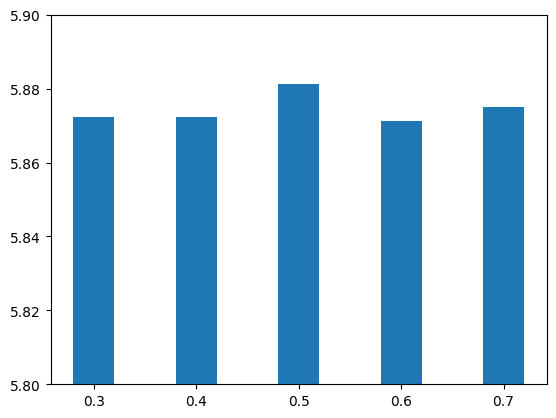

Entropy of recreated image with a=0.4 and d= 3 is equal to: 5.880746877389591
Entropy of recreated image with a=0.4 and d= 4 is equal to: 5.876558520323858
Entropy of recreated image with a=0.4 and d= 5 is equal to: 5.87223244660846


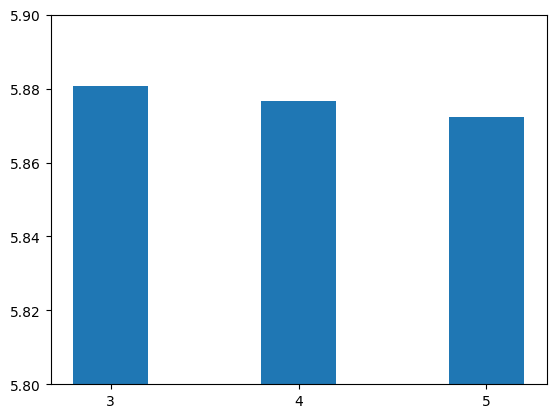

RGB Picture:
Entropy of recreated image with d=5 and a= 0.3 is equal to: 6.142787691182438
Entropy of recreated image with d=5 and a= 0.4 is equal to: 6.142196486326383
Entropy of recreated image with d=5 and a= 0.5 is equal to: 6.1441221950772915
Entropy of recreated image with d=5 and a= 0.6 is equal to: 6.140757391965134
Entropy of recreated image with d=5 and a= 0.7 is equal to: 6.143474523821431


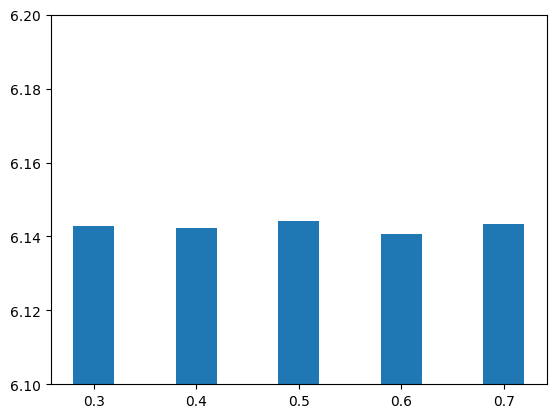

Entropy of recreated image with a=0.4 and d= 3 is equal to: 6.1452430083919625
Entropy of recreated image with a=0.4 and d= 4 is equal to: 6.143708246471488
Entropy of recreated image with a=0.4 and d= 5 is equal to: 6.142196486326383


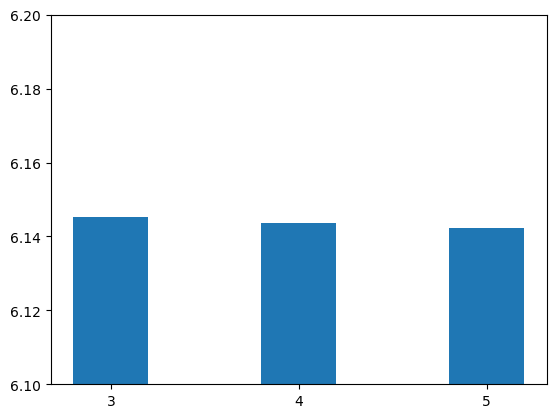

In [ ]:
print("Grayscale Picture:")
avalues=['0.3','0.4','0.5','0.6','0.7']
for i in range(5):
  print("Entropy of recreated image with d=5 and a=",avalues[i],"is equal to:",camera_entropy_a[i])
plt.bar(avalues,camera_entropy_a,width=0.4)
plt.ylim([5.8,5.9])
plt.show()

dvalues=['3','4','5']
for i in range(3):
  print("Entropy of recreated image with a=0.4 and d=",dvalues[i],"is equal to:",camera_entropy_d[i])
plt.bar(dvalues,camera_entropy_d,width=0.4)
plt.ylim([5.8,5.9])
plt.show()

print("RGB Picture:")
for i in range(5):
  print("Entropy of recreated image with d=5 and a=",avalues[i],"is equal to:",lena_entropy_a[i])
plt.bar(avalues,lena_entropy_a,width=0.4)
plt.ylim([6.1,6.2])
plt.show()

for i in range(3):
  print("Entropy of recreated image with a=0.4 and d=",dvalues[i],"is equal to:",lena_entropy_d[i])
plt.bar(dvalues,lena_entropy_d,width=0.4)
plt.ylim([6.1,6.2])
plt.show()

ε) Εντοπίστε το βέλτιστο ‘a’, χρησιμοποιώντας την εντροπία και τη διακύμανση των τιμών των
εικονοστοιχείων σε κάθε επίπεδο της πυραμίδας Laplacian, για κάθε εικόνα.

Από τα αποτελέσματα πιο πάνω, παρατηρούμε ότι και για την ασπρόμαυρη αλλά και για την έγχρωμη εικόνα, χρησιμοποιώντας 'a'=0.6 παίρνουμε τις καλύτερες τιμές εντροπίας. Αυτό συμφωνεί και με τα αποτελέσματα του άρθρου (σελ. 537).

στ) Για το βέλτιστο ‘a’ που υπολογίσατε στο προηγούμενο ερώτημα, κβαντίστε τις εικόνες Lena και
camera χρησιμοποιώντας διαφορετικά bin size (πραγματοποιήστε 2 διαφορετικά πειράματα για
κάθε εικόνα).


Text(0.5, 1.0, 'bins=128')

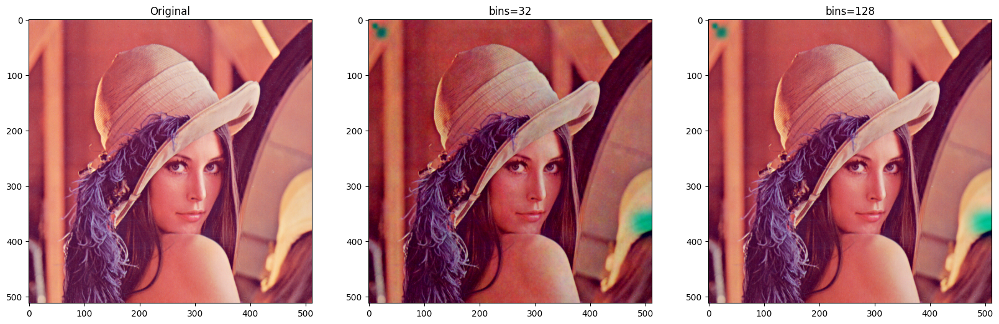

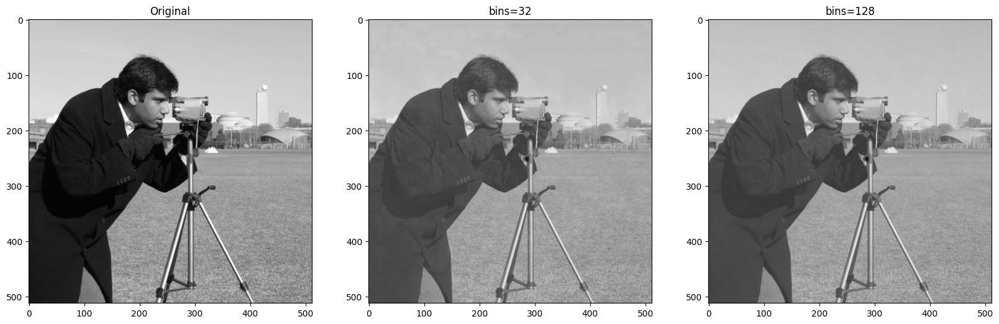

In [ ]:
bins_nums=[32,128]

L_lena=L_Pyramid(lena,0.6,5)
lena_quant=[]
for bins in bins_nums:
  C_lena=[]
  for I in L_lena:
    C_lena.append(L_Quantization(I,bins))
  lena_check=L_Pyramid_Decode(C_lena,0.6)
  lena_quant.append(lena_check)

f,(ax0,ax1,ax2)=plt.subplots(1,3,figsize=(20,20))
ax0.imshow(lena)
ax0.set_title("Original")
ax1.imshow(lena_quant[0])
ax1.set_title("bins=32")
ax2.imshow(lena_quant[1])
ax2.set_title("bins=128")

L_camera=L_Pyramid(camera,0.6,5)
camera_quant=[]
for bins in bins_nums:
  C_camera=[]
  for I in L_camera:
    C_camera.append(L_Quantization(I,bins))
  camera_check=L_Pyramid_Decode(C_camera,0.6)
  camera_quant.append(camera_check)

f,(ax0,ax1,ax2)=plt.subplots(1,3,figsize=(20,20))
ax0.imshow(camera,cmap='gray')
ax0.set_title("Original")
ax1.imshow(camera_quant[0],cmap='gray')
ax1.set_title("bins=32")
ax2.imshow(camera_quant[1],cmap='gray')
ax2.set_title("bins=128")

#### Παρατηρήσεις

Η ποιότητα των εικόνων μειώνεται μετά την κβαντοποίηση τους. Πιο έντονα μπορούμε να το δούμε στις εικόνες RGB οι οποίες έχουν περισσότερη λεπτομέρεια λόγω του χρώματος. Συγκεκριμένα μετα την κβαντοποίηση εμφανίζονται κάποια green spots στα αποτελέσματα που οφείλονται στην επώλεια της λεπτομέρειας εξαιτίας της διαδικασίας.

Παρατηρούμε ότι και στις δύο εικόνες τα διαφορετικά bin sizes που δοκιμάσαμε επηρεάζουν την ανάλυση της εικόνας. Γενικά με μικρότερα bin sizes όπως αναφέραμε προηγουμένος αναμένεται πιο λεπτομερείς κβαντοποίηση της εικόνας. Παρ'όλα αυτα σε κάποιες περιπτώσεις δημιουργείται θόρυβος, προστίθεται λεπτομέρεια που δεν υπήρχε στην original εικόνα και αλλοιώνεται το αποτέλεσμα όπως φαίνεται στην RGB εικόνα με bin size 32 σε αντίθεση με την αντίστοιχη εικόνα με bin size 128.

Οσο δοκιμάζαμε μεγαλύτερα bin sizes παρατηρήσαμε πως οι εικόνες γίνονταν πιο smooth κάτι που είναι λογικό αφού με μεγαλύτερα bin sizes χάνεται η λεπτομέρεια.